# `This project is about predicting depression from the text ⛈️🌧`

# By: 

- [Someone Who Interest In AI 🤖💻](https://github.com/Mo-Shaeerah)

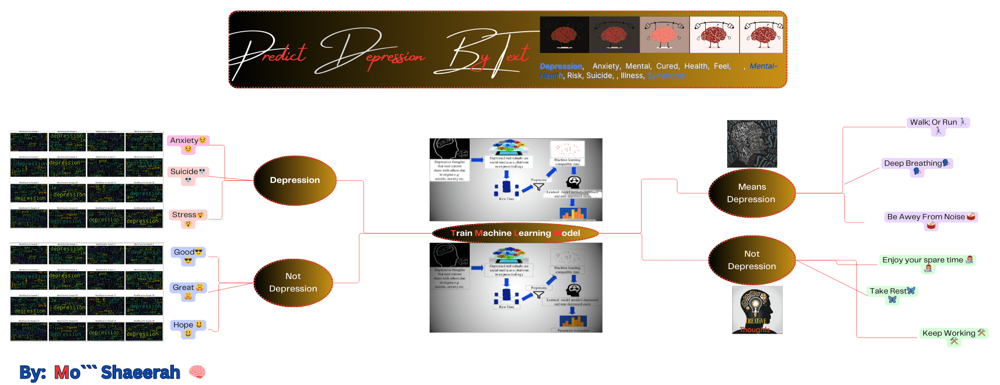

# `1- Import neccesary tools 🪓🪓`

In [1]:
# Import neccesary libraries

import tensorflow 
from PIL import Image
from io import BytesIO

from wordcloud import WordCloud 
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
import time, lightgbm, re, nltk, warnings, requests

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from sklearn.metrics import accuracy_score,confusion_matrix

from sklearn.feature_extraction.text import TfidfVectorizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import pandas as pd, numpy as np, seaborn as sns, matplotlib.pyplot as plt

# Prevent Future Warnings
warnings.filterwarnings('ignore')

data = pd.read_csv("/kaggle/input/sentimental-analysis-for-tweets/sentiment_tweets3.csv")

display(data)

2024-04-09 11:37:53.143496: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-09 11:37:53.143636: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-09 11:37:53.303698: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


,Index,message to examine,label (depression result)
0,106,just had a real good moment. i missssssssss hi...,0
1,217,is reading manga http://plurk.com/p/mzp1e,0
2,220,@comeagainjen http://twitpic.com/2y2lx - http:...,0
3,288,@lapcat Need to send 'em to my accountant tomo...,0
4,540,ADD ME ON MYSPACE!!! myspace.com/LookThunder,0
...,...,...,...
10309,802309,No Depression by G Herbo is my mood from now o...,1
10310,802310,What do you do when depression succumbs the br...,1
10311,802311,Ketamine Nasal Spray Shows Promise Against Dep...,1
10312,802312,dont mistake a bad day with depression! everyo...,1


# `2- Get Insights & Do Visualize 🔎🔍`

In [2]:
display(
    data.info(),
    '--------------',
    
    data.describe(), 
    '----------------',
    
    data.isnull().sum(),
    '--------------------',
    
    (data == 0).value_counts(),
    '-------------------------',
    
    data.value_counts().unique(),
    '----------------------------',    
    
    data.duplicated().value_counts()
)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10314 entries, 0 to 10313
Data columns (total 3 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   Index                      10314 non-null  int64 
 1   message to examine         10314 non-null  object
 2   label (depression result)  10314 non-null  int64 
dtypes: int64(2), object(1)
memory usage: 241.9+ KB


None

'--------------'

,Index,label (depression result)
count,10314.000000,10314.000000
mean,491253.470525,0.224355
std,261688.134407,0.417177
min,106.000000,0.000000
25%,263019.250000,0.000000
50%,514988.000000,0.000000
75%,773521.500000,0.000000
max,802313.000000,1.000000


'----------------'

Index                        0
message to examine           0
label (depression result)    0
dtype: int64

'--------------------'

Index  message to examine  label (depression result)
False  False               True                         8000
                           False                        2314
Name: count, dtype: int64

'-------------------------'

array([1])

'----------------------------'

False    10314
Name: count, dtype: int64

In [3]:
# Drop the 'Index' column
data.drop(columns=['Index'], inplace=True)

# Rename the columns
data.rename(columns={'message to examine': 'text', 'label (depression result)': 'depressed'}, inplace=True)

# Display a sample to verify the changes
display(data.sample(10))

,text,depressed
7363,"will shop for labels, while those ladies lay a...",0
4692,Woohoo! Beta launched today off tomorrow then...,0
4062,@kristenstewart9 Did you enjoy Montepulciano?,0
1168,@Sims3Nieuws just have been away for 2 years: ...,0
7380,@meeshiefeet I look forward to see the Spider ...,0
8377,Depression/anxiety is being in a constant stat...,1
6532,Yay I got a PT on my Scholar.,0
3820,@maynaseric :beep beep:,0
3736,@bethannon The kids are 7 and 2,0
3214,so glad the day is over ! excited for tonight,0


In [4]:
data.text.sample(15)

7999                    ReCoVeRiNg FrOm ThE lOnG wEeKeNd 
7449                       @GermainGerome Yes sir it is. 
2544                                       In Long Beach 
4867    @_Oodledoodle s'all good we want ahealthy size...
5870    this is not what it may seem......it's FOC  â™...
7050    @jovenatheart COOOOL morning!  I want to see T...
342     @ryanhawiya yeah i wouldnt care if i was in a ...
1992    just bought my @warped09 tix  please dm me if ...
3255    @mrsjackbauer7 haha omg it works now... finally! 
5168    @Karageorgakis ... for once in a while. Still ...
6769                             m&amp;d's i think soooo 
3959    @gdeberti Thank you, i'm just now getting to c...
1539    @stupax I have dropped you an email via your s...
1473    @minette95 im gonna go listen to it right now!...
318     @melraemorgan Thank you. When i was younger i ...
Name: text, dtype: object

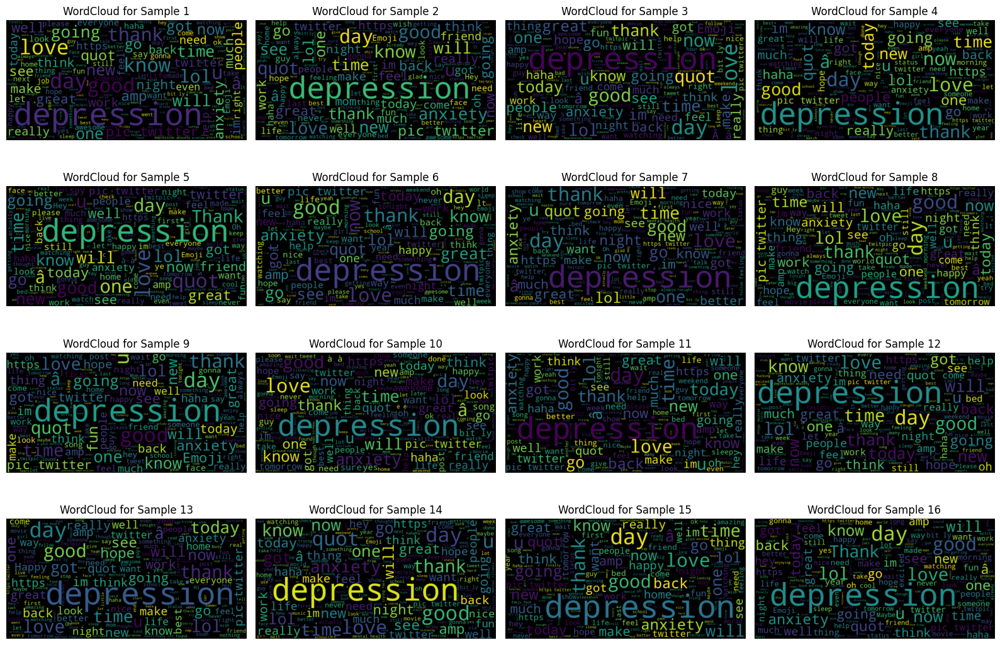

In [5]:
# Create subplots
fig, axs = plt.subplots(4, 4, figsize=(16, 11))

# Generate and display WordCloud for each row
for i in range(4):
    for j in range(4):
        # Concatenate text data for the current subplot
        row_text = ' '.join(data['text'].sample(n=1000))   
        
        # Generate WordCloud
        wordcloud = WordCloud(width=800, height=400, background_color='black').generate(row_text)
        
        # Display WordCloud
        axs[i, j].imshow(wordcloud, interpolation='bilinear')
        axs[i, j].set_title(f'WordCloud for Sample {i*4 + j + 1}')
        axs[i, j].axis('off')

# Adjust layout and display subplots
plt.tight_layout()
plt.show()

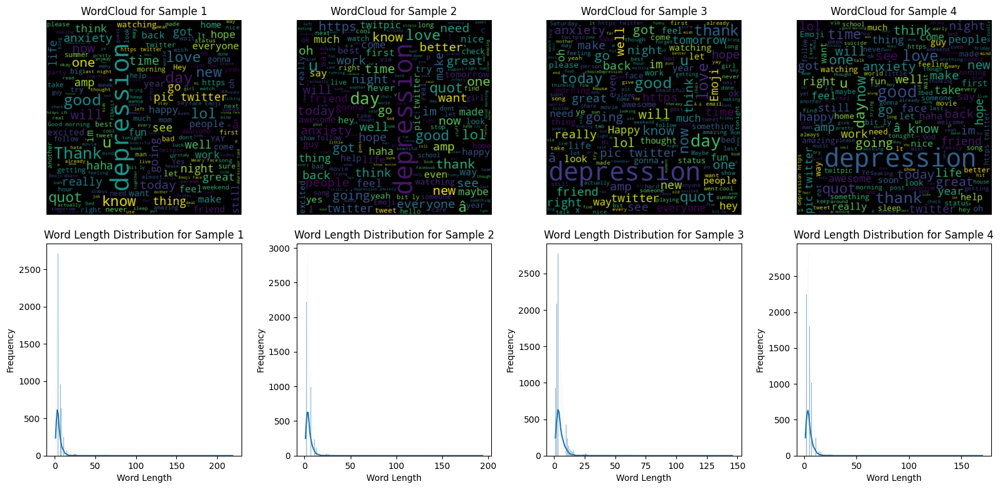

In [6]:
# Create subplots
fig, axs = plt.subplots(2, 4, figsize=(16, 8))

# Generate and display WordCloud and KDE plot for each column
for j in range(4):
    # Concatenate text data for the current column
    col_text = ' '.join(data['text'].sample(n=1000))
    
    # Generate WordCloud
    wordcloud = WordCloud(width=400, height=400, background_color='black').generate(col_text)
    
    # Display WordCloud
    axs[0, j].imshow(wordcloud, interpolation='bilinear')
    axs[0, j].set_title(f'WordCloud for Sample {j+1}')
    axs[0, j].axis('off')
    
    # Generate KDE plot for word lengths
    word_lengths = [len(word) for word in col_text.split()]
    sns.histplot(word_lengths, kde=True, line_kws={"color":"r"}, ax=axs[1, j])
    axs[1, j].set_title(f'Word Length Distribution for Sample {j+1}')
    axs[1, j].set_xlabel('Word Length')
    axs[1, j].set_ylabel('Frequency')

# Adjust layout and display subplots
plt.tight_layout()
plt.show()

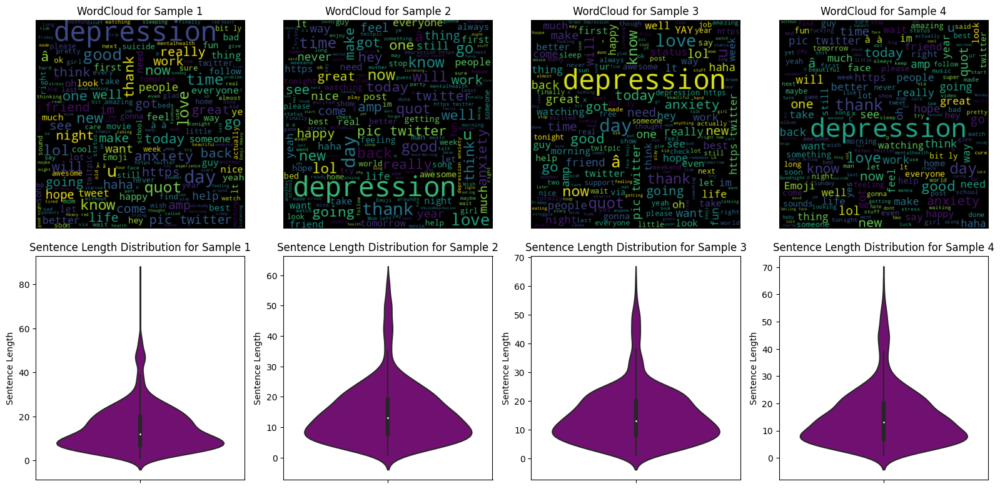

In [7]:
# Create subplots
fig, axs = plt.subplots(2, 4, figsize=(16, 8))

# Generate and display WordCloud and violin plot for each column
for j in range(4):
    col_text = data['text'].sample(n=1000)
    
    # Calculate lengths of sentences
    sentence_lengths = col_text.apply(lambda x: len(x.split()))
    
    # Generate WordCloud
    wordcloud = WordCloud(width=400, height=400, background_color='black').generate(' '.join(col_text))
    
    # Display WordCloud
    axs[0, j].imshow(wordcloud, interpolation='bilinear')
    axs[0, j].set_title(f'WordCloud for Sample {j+1}')
    axs[0, j].axis('off')
    
    # Generate violin plot for sentence lengths
    sns.violinplot(y=sentence_lengths, ax=axs[1, j], color='purple')
    axs[1, j].set_title(f'Sentence Length Distribution for Sample {j+1}')
    axs[1, j].set_ylabel('Sentence Length')

# Adjust layout and display subplots
plt.tight_layout()
plt.show()

- Most sentences have length of words between 8 - 15

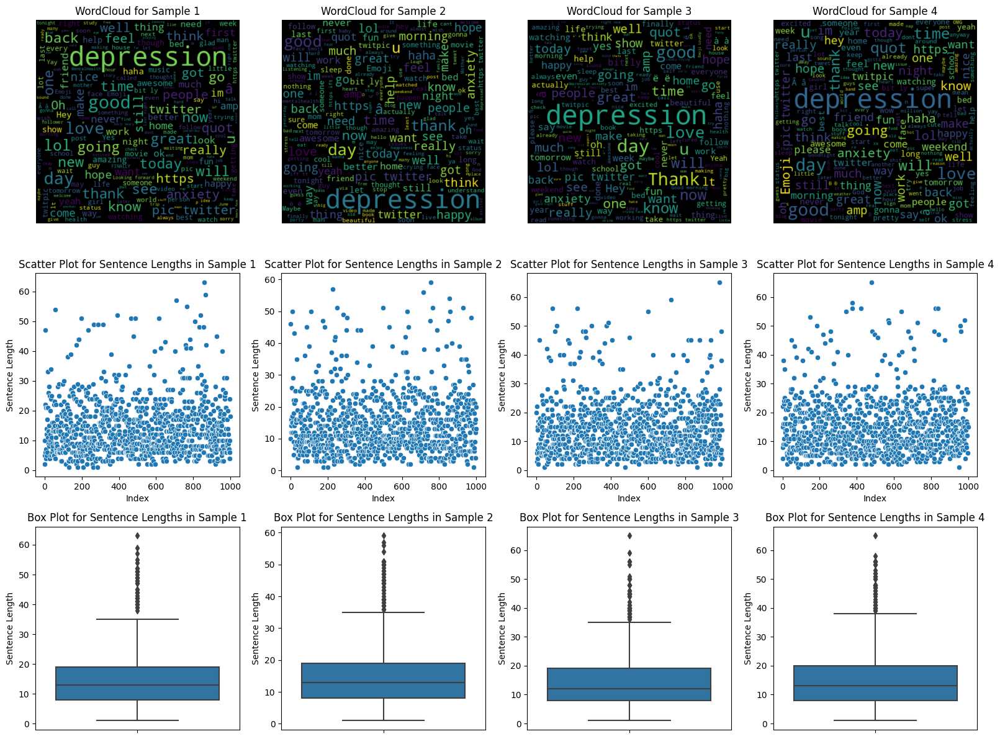

In [8]:
# Create subplots
fig, axs = plt.subplots(3, 4, figsize=(16, 12))

# Generate and display WordCloud, scatter plot, and box plot for each Sample of data
for j in range(4):
    col_text = data['text'].sample(n=1000)
    
    # Calculate lengths of sentences
    sentence_lengths = col_text.apply(lambda x: len(x.split()))
    
    # Generate WordCloud
    wordcloud = WordCloud(width=400, height=400, background_color='black').generate(' '.join(col_text))
    
    # Display WordCloud
    axs[0, j].imshow(wordcloud, interpolation='bilinear')
    axs[0, j].set_title(f'WordCloud for Sample {j+1}')
    axs[0, j].axis('off')
    
    # Generate scatter plot for sentence lengths
    sns.scatterplot(x=range(len(sentence_lengths)), y=sentence_lengths, ax=axs[1, j])
    axs[1, j].set_title(f'Scatter Plot for Sentence Lengths in Sample {j+1}')
    axs[1, j].set_xlabel('Index')
    axs[1, j].set_ylabel('Sentence Length')
    
    # Generate box plot for sentence lengths
    sns.boxplot(y=sentence_lengths, ax=axs[2, j])
    axs[2, j].set_title(f'Box Plot for Sentence Lengths in Sample {j+1}')
    axs[2, j].set_ylabel('Sentence Length')

# Adjust layout and display subplots
plt.tight_layout()
plt.show()

# `4- Preprocess the text & Do Vectorise 🕘🕜`

In [9]:
# download 
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Define function for preprocessing text
def preprocess_text(text):
    # Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)
    
    # Remove usernames (mentions)
    text = re.sub(r'@[A-Za-z0-9_]+', '', text)
    
    # Remove numbers
    text = re.sub(r'\d+', '', text)
    
    # Remove non-alphanumeric characters and keep only letters and spaces
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    
    # Tokenization
    tokens = word_tokenize(text)
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word.lower() not in stop_words]
    
    # Join tokens back into text
    preprocessed_text = ' '.join(tokens)
    return preprocessed_text

# Apply preprocessing to 'text' column
data['clean_text'] = data['text'].apply(preprocess_text)

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /usr/share/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [10]:
data

,text,depressed,clean_text
0,just had a real good moment. i missssssssss hi...,0,real good moment missssssssss much
1,is reading manga http://plurk.com/p/mzp1e,0,reading manga
2,@comeagainjen http://twitpic.com/2y2lx - http:...,0,
3,@lapcat Need to send 'em to my accountant tomo...,0,Need send em accountant tomorrow Oddly wasnt e...
4,ADD ME ON MYSPACE!!! myspace.com/LookThunder,0,ADD MYSPACE myspacecomLookThunder
...,...,...,...
10309,No Depression by G Herbo is my mood from now o...,1,Depression G Herbo mood im done stressing peop...
10310,What do you do when depression succumbs the br...,1,depression succumbs brain makes feel like youl...
10311,Ketamine Nasal Spray Shows Promise Against Dep...,1,Ketamine Nasal Spray Shows Promise Depression ...
10312,dont mistake a bad day with depression! everyo...,1,dont mistake bad day depression everyone em


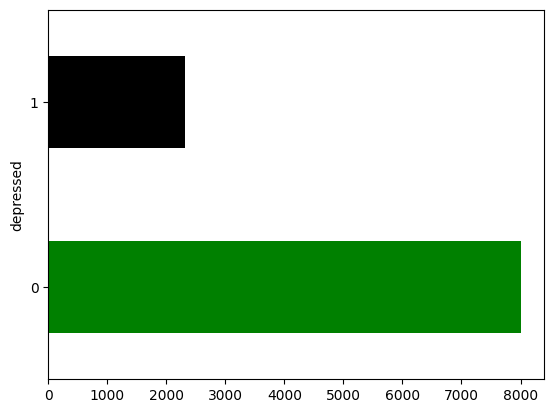

In [11]:
data.depressed.value_counts().plot(kind='barh', color=['green', 'black']);

In [12]:
data.clean_text.sample(10)

4948                                           get groove
8826    Black children drown depression even talk fami...
9346    Postshow depression Addams Family weird sporad...
8966    dp spearheaded huge initiative spread awarenes...
8833    BeingAdoptedMeans struggled depression entire ...
8179         Nog PTSD depression insanely good incredible
7811    sure exactly Ive competition Either way Ive st...
6275                                       HAHA win one x
3391                                                  hey
2407    little cool thing wcegov opengov dialogue quot...
Name: clean_text, dtype: object

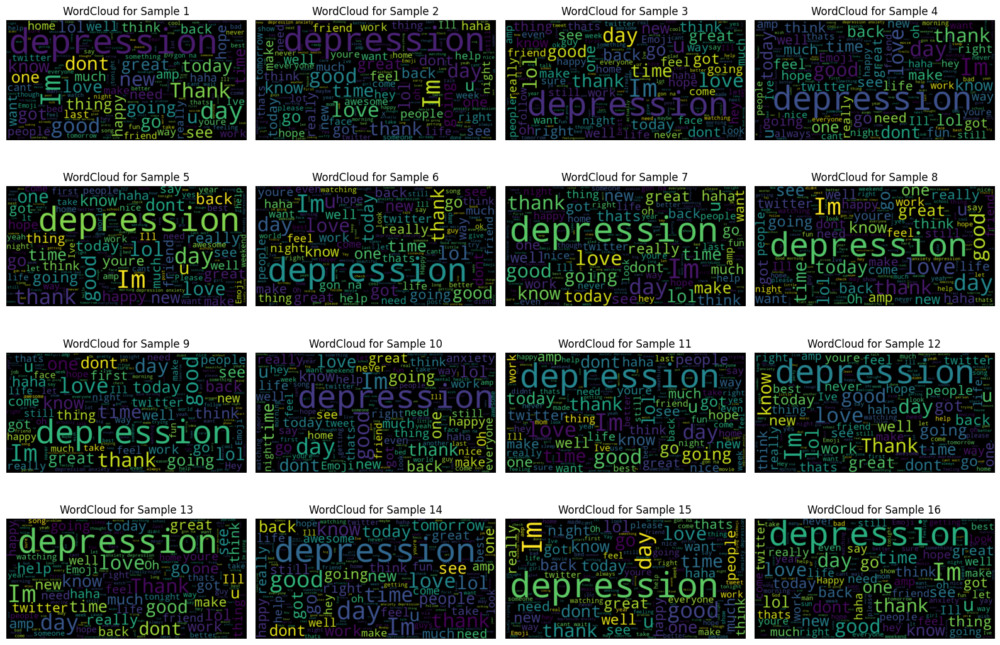

In [13]:
# Create subplots
fig, axs = plt.subplots(4, 4, figsize=(16, 11))

# Generate and display WordCloud for each row
for i in range(4):
    for j in range(4):
        # Concatenate text data for the current subplot
        row_text = ' '.join(data['clean_text'].sample(n=1000))
        
        # Generate WordCloud
        wordcloud = WordCloud(width=800, height=400, background_color='black').generate(row_text)
        
        # Display WordCloud
        axs[i, j].imshow(wordcloud, interpolation='bilinear')
        axs[i, j].set_title(f'WordCloud for Sample {i*4 + j + 1}')
        axs[i, j].axis('off')

# Adjust layout and display subplots
plt.tight_layout()
plt.show()

In [14]:
# Initialize TF-IDF vectorizer
tfidf_vectorizer = TfidfVectorizer()

# Fit and transform the text data
text_data = tfidf_vectorizer.fit_transform(data['clean_text']).toarray()

text_data[1:11]

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

# `5- Split Data & Check its shape ✂️✂`

In [15]:
# Make data into X(Observation) and y(labels)
X, y = text_data, data.depressed

# Now split them in training and testing
X_train,X_test,y_train,y_test = train_test_split(X, y,
                                                 test_size=0.25, random_state=42)

# Check the length of each one
len(X_train), len(X_test), len(y_train), len(y_test)

(7735, 2579, 7735, 2579)

# `6- Start Modeling stage 🪀🏍️`

`6.1`- Logistic-Regression Classifier

In [16]:
# Start the timer
start_time = time.time()

# Initialize Logistic Regression classifier
logreg_classifier = LogisticRegression()

logreg_classifier.fit(X_train, y_train)

# Stop the timer
end_time = time.time()

# Calculate the elapsed time
logreg_training_time = end_time - start_time
print("Training time for Logistic Regressionજ⁀➴જ⁀➴જ⁀➴:", logreg_training_time, "seconds")
print()

# Predictions
y_pred_logreg = logreg_classifier.predict(X_test)

# Compute accuracy score & confusion matrix
accuracy_logreg, conf_matrix = accuracy_score(y_test, y_pred_logreg), confusion_matrix(y_test, y_pred_logreg)
print("Logistic Regression Accuracy:", accuracy_logreg, "  જ⁀➴જ⁀➴જ⁀➴  Logistic Regression Confusion Matrix:", conf_matrix)

Training time for Logistic Regressionજ⁀➴જ⁀➴જ⁀➴: 8.100952625274658 seconds

Logistic Regression Accuracy: 0.9767351686700272   જ⁀➴જ⁀➴જ⁀➴  Logistic Regression Confusion Matrix: [[2011    0]
 [  60  508]]


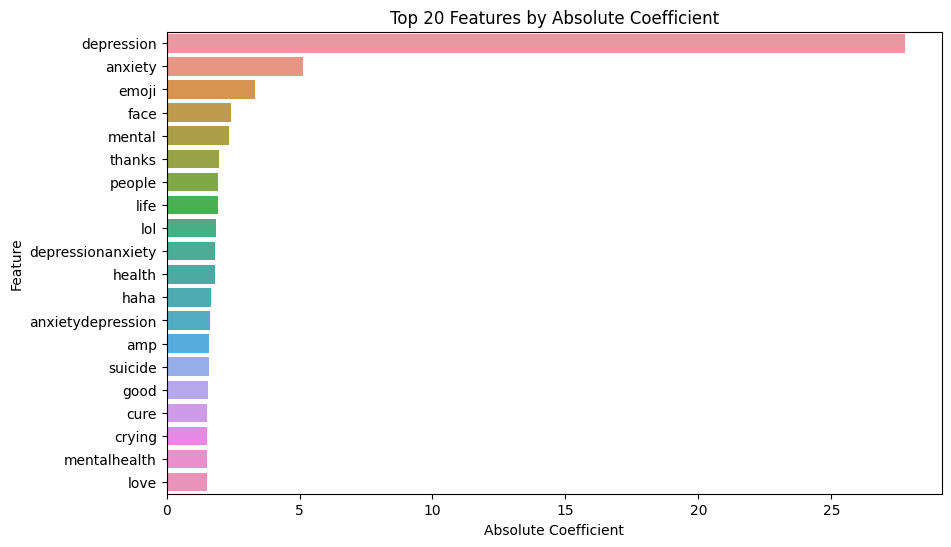

In [17]:
# Get coefficients
coefficients = logreg_classifier.coef_[0]

# Get feature names
feature_names = np.array(tfidf_vectorizer.get_feature_names_out())

# Create a DataFrame
importance_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})
importance_df['Absolute_Coefficient'] = np.abs(importance_df['Coefficient'])
importance_df = importance_df.sort_values(by='Absolute_Coefficient', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Absolute_Coefficient', y='Feature', data=importance_df.head(20))
plt.title('Top 20 Features by Absolute Coefficient')
plt.xlabel('Absolute Coefficient')
plt.ylabel('Feature')
plt.show()

1- Start Predicting depression by `Logistic Regression Classifier` 🚥🚥⛈️

In [18]:
# My text
my_text = 'I feel nervous'

# Preprocess the my-text and vectorize it
cleaned_text = preprocess_text(my_text)
vectorized_text = tfidf_vectorizer.transform([cleaned_text])

# Make predictions
prediction = logreg_classifier.predict(vectorized_text)

# Interpret prediction
interpretation = "depression" if prediction == 1 else "not depression"
print(f" {my_text} indicates 👉🏻☛☛☛ {interpretation}.")

 I feel nervous indicates 👉🏻☛☛☛ not depression.


In [19]:
# My text
my_text_1 = 'I feel nervous, hopeless and depressed'

# Preprocess the my-text and vectorize it
cleaned_text = preprocess_text(my_text_1)
vectorized_text = tfidf_vectorizer.transform([cleaned_text])

# Make predictions
prediction = logreg_classifier.predict(vectorized_text)

# Interpret prediction
interpretation = "depression" if prediction == 1 else "not depression"
print(f" {my_text_1} indicates 👉🏻☛☛☛ {interpretation}.")

 I feel nervous, hopeless and depressed indicates 👉🏻☛☛☛ not depression.


`6.2`- Multinomial Naive Bias

In [20]:
# Start the timer
start_time = time.time()

# Initialize Naive Bayes 
nb_classifier = MultinomialNB()

nb_classifier.fit(X_train, y_train)

# Stop the timer
end_time = time.time()

# Calculate the elapsed time
nb_training_time = end_time - start_time
print("Training time for Naive Bayesજ⁀➴જ⁀➴જ⁀➴", nb_training_time, "seconds")
print()

# Predictions on testing set
y_pred_nb = nb_classifier.predict(X_test)

# Evaluate model performance
accuracy_nb, conf_matrix = accuracy_score(y_test, y_pred_nb), confusion_matrix(y_test, y_pred_nb)
print("Naive Bayes Accuracy on Validation Set:", accuracy_nb, " જ⁀➴જ⁀➴જ⁀➴   Naive Bayes Confusion Matrix: ", conf_matrix)

Training time for Naive Bayesજ⁀➴જ⁀➴જ⁀➴ 0.32773399353027344 seconds

Naive Bayes Accuracy on Validation Set: 0.899185730903451  જ⁀➴જ⁀➴જ⁀➴   Naive Bayes Confusion Matrix:  [[2009    2]
 [ 258  310]]


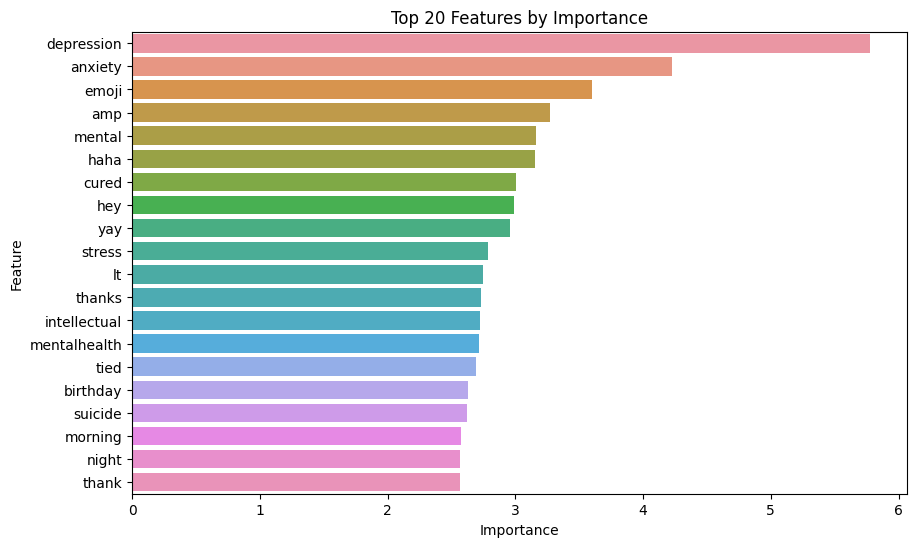

In [21]:
# Get the feature log probabilities
feature_probs = nb_classifier.feature_log_prob_

# Get feature names
feature_names = np.array(tfidf_vectorizer.get_feature_names_out())

# Calculate importance scores for each feature
importance_scores = np.max(feature_probs, axis=0) - np.min(feature_probs, axis=0)

# Create a DataFrame
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importance_scores})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(20))
plt.title('Top 20 Features by Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

2- Start Predicting depression by `Naive Bayes Classifier` 🚥🚥⛈️

In [22]:
# My text
my_text_1 = 'I feel nervous, hopeless and depressed'

# Preprocess the my-text and vectorize it
cleaned_text = preprocess_text(my_text_1)
vectorized_text = tfidf_vectorizer.transform([cleaned_text])

# Make predictions
prediction = nb_classifier.predict(vectorized_text)

# Interpret prediction
interpretation = "depression" if prediction == 1 else "not depression"
print(f" {my_text_1} indicates 👉🏻☛☛☛ {interpretation}.")

 I feel nervous, hopeless and depressed indicates 👉🏻☛☛☛ depression.


Same text but different prediction with Multinomail Naive bayes model  😲😲

In [23]:
def Predict_depression(text):
    # preprocess
    cleaned_text = preprocess_text(text)
    vectorized_text = tfidf_vectorizer.transform([cleaned_text])

    # predictions
    prediction = nb_classifier.predict(vectorized_text)

    # Interpret
    interpretation = "depression" if prediction == 1 else "not depression"
    
    # Print result
    print(f"{text} indicates 👉🏻☛☛☛ {interpretation}.")
    

Predict_depression("I enjoying my time by studying AI")

I enjoying my time by studying AI indicates 👉🏻☛☛☛ not depression.


In [24]:
# Put your message inside the function and see if it indicates depression or Not

Predict_depression('I am not a happy person')

I am not a happy person indicates 👉🏻☛☛☛ not depression.


In [25]:
Predict_depression('I life with anxiety')

I life with anxiety indicates 👉🏻☛☛☛ depression.


In [26]:
Predict_depression('Suicide rate is continualy increase in the recent years')

Suicide rate is continualy increase in the recent years indicates 👉🏻☛☛☛ depression.


`6.3`- LightGBM Classifier

In [27]:
# Start the timer
start_time = time.time()

# Initialize lightgbm classifier
lgbm_classifier = lightgbm.LGBMClassifier(verbosity=-1)

lgbm_classifier.fit(X_train, y_train)

# Stop the timer
end_time = time.time()

# Calculate the elapsed time
lgbm_training_time = end_time - start_time
print("Training time for lightgbmજ⁀➴જ⁀➴જ⁀➴", lgbm_training_time, "seconds")
print()

# Predictions on testing set
y_pred_lgbm = lgbm_classifier.predict(X_test)

# Evaluate model performance
accuracy_lgbm, conf_matrix = accuracy_score(y_test, y_pred_lgbm), confusion_matrix(y_test, y_pred_lgbm)
print("Light-GBM Accuracy on Validation Set:", accuracy_lgbm, " જ⁀➴જ⁀➴જ⁀➴   Light-GBM Confusion Matrix: ", conf_matrix)

Training time for lightgbmજ⁀➴જ⁀➴જ⁀➴ 1.4294593334197998 seconds

Light-GBM Accuracy on Validation Set: 0.9899185730903451  જ⁀➴જ⁀➴જ⁀➴   Light-GBM Confusion Matrix:  [[2010    1]
 [  25  543]]


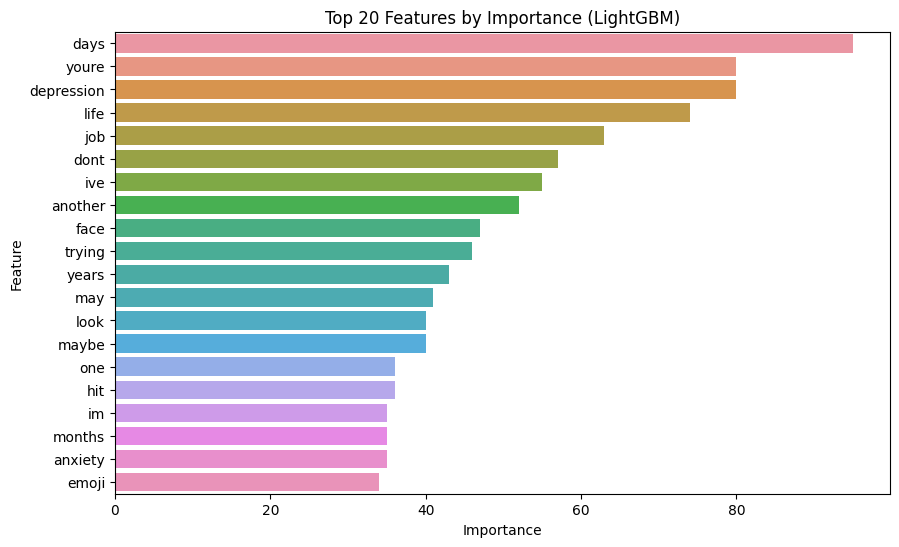

In [28]:
# Get feature importances
feature_importances = lgbm_classifier.feature_importances_

# Get feature names
feature_names = tfidf_vectorizer.get_feature_names_out()

# Create a DataFrame
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df.head(20))
plt.title('Top 20 Features by Importance (LightGBM)')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

3- Start Predicting depression by `Light-GBM Classifier` 🚥🚥⛈️

In [29]:
def Predict_depression(text):
    # Preprocess
    cleaned_text = preprocess_text(text)
    vectorized_text = tfidf_vectorizer.transform([cleaned_text])

    # predictions
    prediction = lgbm_classifier.predict(vectorized_text)

    # prediction
    interpretation = "depression" if prediction == 1 else "not depression"
    
    # Print
    print(f"{text} indicates 👉🏻☛☛☛ {interpretation}.")
    

Predict_depression("I enjoying my time by studying AI")

I enjoying my time by studying AI indicates 👉🏻☛☛☛ not depression.


In [30]:
Predict_depression("😞")

😞 indicates 👉🏻☛☛☛ not depression.


In [31]:
Predict_depression("Months and days I struggle e` mental-health issues ☹☹")

Months and days I struggle e` mental-health issues ☹☹ indicates 👉🏻☛☛☛ not depression.


`6.4`- Recurrent Neural Networks (RNN)

In [32]:
# Convert input data to strings
X_train_list = [str(text) for text in X_train]
X_test_list = [str(text) for text in X_test]

# Preprocess text data
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train_list)
sequences_train = tokenizer.texts_to_sequences(X_train_list)
sequences_test = tokenizer.texts_to_sequences(X_test_list)

# Calculate maximum sequence length
max_sequence_length = max(max(len(seq) for seq in sequences_train), max(len(seq) for seq in sequences_test))

# Pad sequences
padded_sequences_train = pad_sequences(sequences_train, maxlen=max_sequence_length, padding='post')
padded_sequences_test = pad_sequences(sequences_test, maxlen=max_sequence_length, padding='post')

# Build the RNN model
model = tensorflow.keras.Sequential([
    
    tensorflow.keras.layers.Embedding(len(tokenizer.word_index) + 1, 32),
    tensorflow.keras.layers.LSTM(32, return_sequences=True, activation="tanh",dropout=0.2),
    tensorflow.keras.layers.GlobalMaxPooling1D(),
    tensorflow.keras.layers.Dense(64, activation='relu'),
    tensorflow.keras.layers.Dense(1, activation='sigmoid')
    
])

# Compile the model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Train the model
model.fit(padded_sequences_train, y_train, epochs=10, batch_size=32, validation_split=0.2)

# Evaluate the model
loss, accuracy = model.evaluate(padded_sequences_test, y_test)
print("Test Loss:", loss)
print("Test Accuracy:", accuracy)

Epoch 1/10
194/194 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.7517 - loss: 0.5840 - val_accuracy: 0.7796 - val_loss: 0.5258
Epoch 2/10
194/194 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.7696 - loss: 0.5404 - val_accuracy: 0.7796 - val_loss: 0.5252
Epoch 3/10
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7772 - loss: 0.5313 - val_accuracy: 0.7796 - val_loss: 0.5258
Epoch 4/10
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7717 - loss: 0.5381 - val_accuracy: 0.7796 - val_loss: 0.5253
Epoch 5/10
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7646 - loss: 0.5482 - val_accuracy: 0.7796 - val_loss: 0.5254
Epoch 6/10
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7713 - loss: 0.5381 - val_accuracy: 0.7796 - val_loss: 0.5255
Epoch 7/10
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7784 - loss: 0.5297 - val_accuracy: 0.7796 - val_loss: 0.5263
Epoch 8/10
194/194 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7773 - loss: 0.5313 - val_accuracy: 0.

4- Start Predicting depression by `RNN Classifier` 🚥🚥⛈️

In [33]:
def Predict_depression(text):
    # Preprocess text
    cleaned_text = str(text)
    sequence = tokenizer.texts_to_sequences([cleaned_text])
    padded_sequence = pad_sequences(sequence, maxlen=max_sequence_length, padding='post')
    
    # Predict depression
    prediction = model.predict(padded_sequence)
    
    # Interpret prediction
    if prediction > 0.5:
        interpretation = "depression"
    else:
        interpretation = "not depression"
    
    # Print result
    print(f"{text} indicates 👉🏻☛☛☛ {interpretation} with a probability of {prediction[0][0]:.2f} 📡")

# Example usage
Predict_depression("I'm feeling very sad today")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
I'm feeling very sad today indicates 👉🏻☛☛☛ not depression with a probability of 0.28 📡


In [34]:
# Put your message
Predict_depression("Weather is good, trees are wonderful")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Weather is good, trees are wonderful indicates 👉🏻☛☛☛ not depression with a probability of 0.28 📡


In [35]:
# Example usage
Predict_depression("suicide, anxiety and risk are words of depression")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
suicide, anxiety and risk are words of depression indicates 👉🏻☛☛☛ not depression with a probability of 0.28 📡


# `7- Predicting text e' > than 1 model at the same time [other dimension 📐⏳]`

I am feeling very low today indicates 👉🏻☛☛☛ not depression by Naive Bayes with probability 0.84 📡


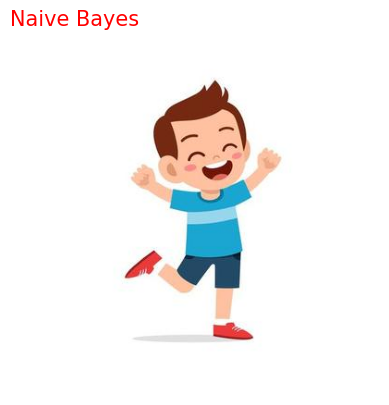

I am feeling very low today indicates 👉🏻☛☛☛ not depression by Logistic Regression with probability 0.87 📡


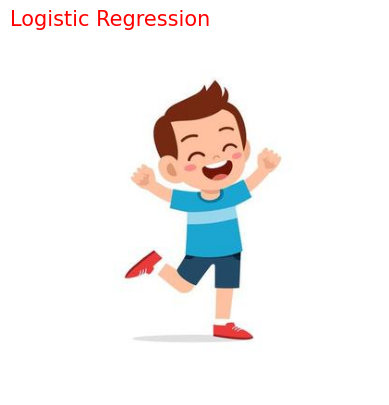

I am feeling very low today indicates 👉🏻☛☛☛ not depression by LightGBM with probability 0.84 📡


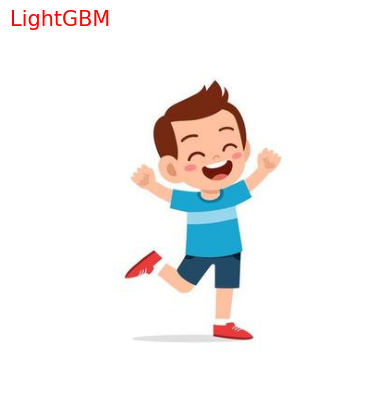

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
I am feeling very low today indicates 👉🏻☛☛☛ not depression by RNN with probability 0.28 📡


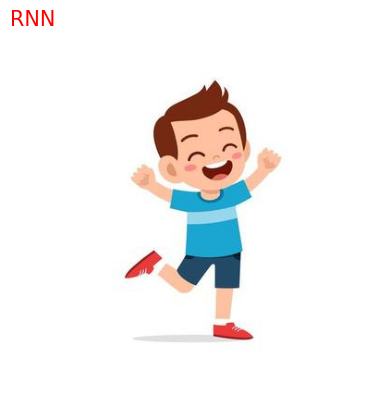

In [36]:
def Predict_depression(text, models):
    
    for model_name, model in models.items():
        # Preprocess
        cleaned_text = preprocess_text(text)
        vectorized_text = tfidf_vectorizer.transform([cleaned_text])

        # Predictions
        if model_name == 'RNN':
            # Pad sequences for RNN model
            sequences = tokenizer.texts_to_sequences([cleaned_text])
            padded_sequences = pad_sequences(sequences, maxlen=max_sequence_length, padding='post')
            probability = np.max(model.predict(padded_sequences))
            prediction = 1 if probability >= 0.5 else 0
            
        else:
            prediction = model.predict(vectorized_text)
            probability = np.max(model.predict_proba(vectorized_text))
            prediction = prediction[0]

        # Print results
        if prediction == 1:  # Depression
            # Load depression image from the internet
            img_url = 'https://neurosciencenews.com/files/2023/12/metabolism-depression-neurosucence.jpg'
            response = requests.get(img_url)
            img = Image.open(BytesIO(response.content))
            print(f"{text} indicates 👉🏻☛☛☛ depression by {model_name} with probability {probability:.2f} 🎯")
            
        else:  # Not depression
            # Load happy image from the internet
            img_url = 'https://static.vecteezy.com/system/resources/thumbnails/007/942/905/small_2x/cute-little-kid-boy-stand-happy-celebrating-pose-expression-vector.jpg'
            response = requests.get(img_url)
            img = Image.open(BytesIO(response.content))
            print(f"{text} indicates 👉🏻☛☛☛ not depression by {model_name} with probability {probability:.2f} 📡")
        
        # Display the image
        plt.imshow(img)
        plt.text(0, 0, model_name, color='red', fontsize=15, ha='left')
        plt.axis('off')
        plt.show()

# Example usage
models = {'Naive Bayes': nb_classifier, 'Logistic Regression': logreg_classifier, 'LightGBM': lgbm_classifier, 'RNN': model}
Predict_depression("I am feeling very low today", models)

There is an internal pressure pushing me to commiting suicide indicates 👉🏻☛☛☛ depression by Naive Bayes with probability 0.57 🎯


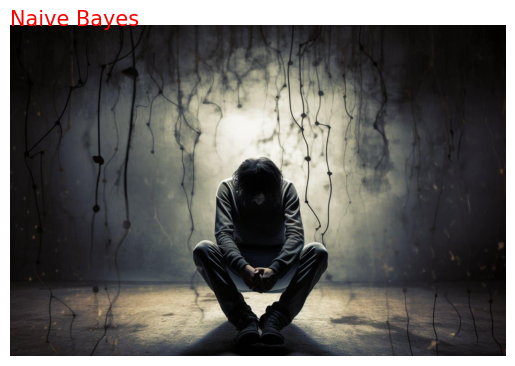

There is an internal pressure pushing me to commiting suicide indicates 👉🏻☛☛☛ not depression by Logistic Regression with probability 0.84 📡


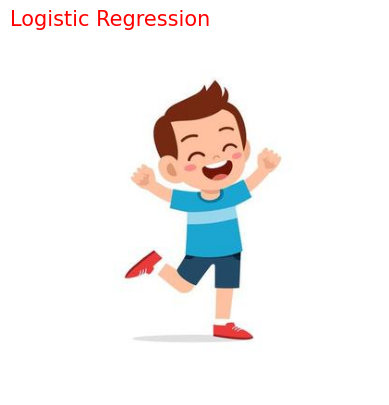

There is an internal pressure pushing me to commiting suicide indicates 👉🏻☛☛☛ not depression by LightGBM with probability 1.00 📡


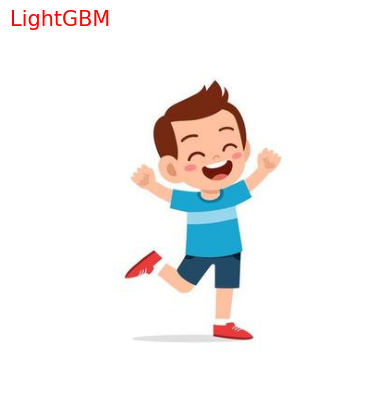

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
There is an internal pressure pushing me to commiting suicide indicates 👉🏻☛☛☛ not depression by RNN with probability 0.28 📡


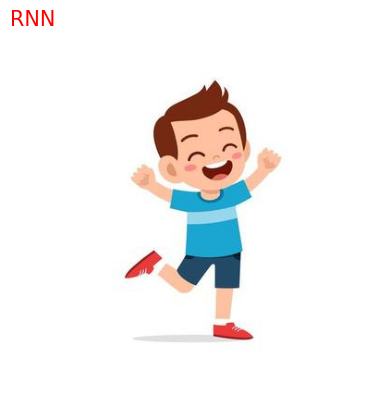

In [37]:
# Type here[In between the parenthesis] What you want
Predict_depression("There is an internal pressure pushing me to commiting suicide", models)

My days are about anxiety indicates 👉🏻☛☛☛ depression by Naive Bayes with probability 0.67 🎯


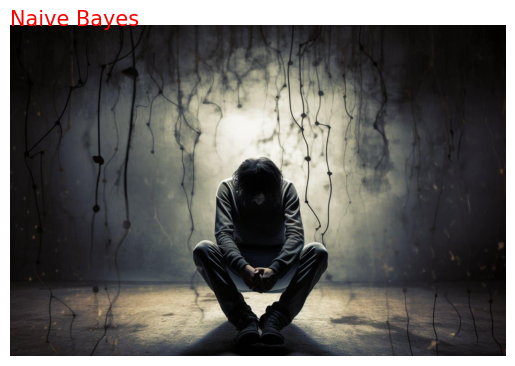

My days are about anxiety indicates 👉🏻☛☛☛ depression by Logistic Regression with probability 0.71 🎯


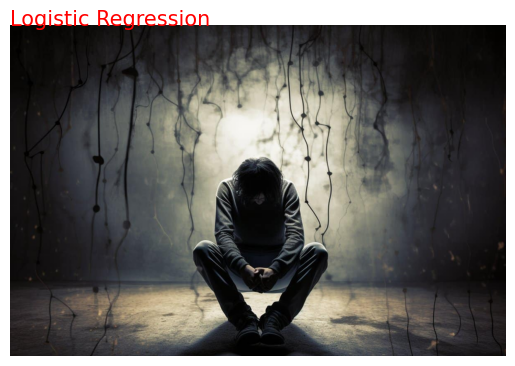

My days are about anxiety indicates 👉🏻☛☛☛ depression by LightGBM with probability 0.99 🎯


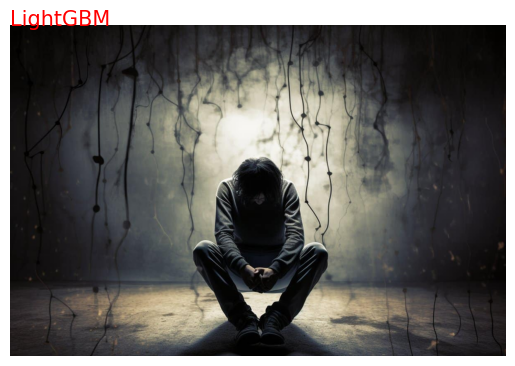

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
My days are about anxiety indicates 👉🏻☛☛☛ not depression by RNN with probability 0.28 📡


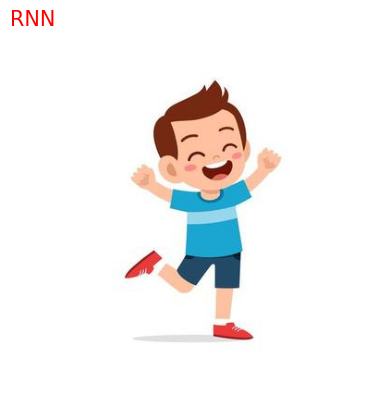

In [38]:
Predict_depression("My days are about anxiety", models)

I am not a depressed person that who see the world from his dark window indicates 👉🏻☛☛☛ not depression by Naive Bayes with probability 0.56 📡


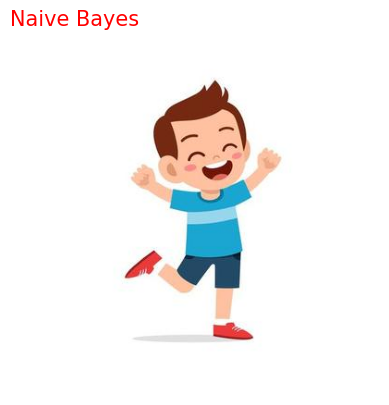

I am not a depressed person that who see the world from his dark window indicates 👉🏻☛☛☛ not depression by Logistic Regression with probability 0.82 📡


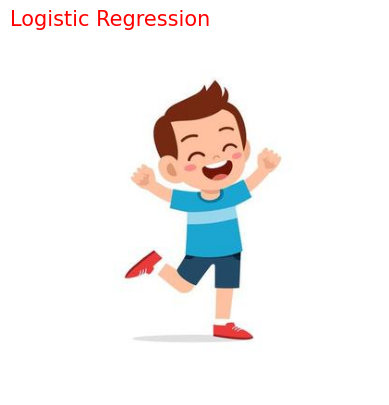

I am not a depressed person that who see the world from his dark window indicates 👉🏻☛☛☛ not depression by LightGBM with probability 1.00 📡


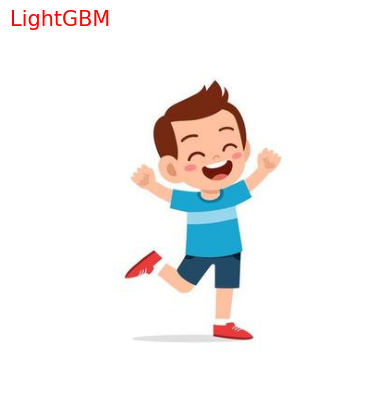

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
I am not a depressed person that who see the world from his dark window indicates 👉🏻☛☛☛ not depression by RNN with probability 0.28 📡


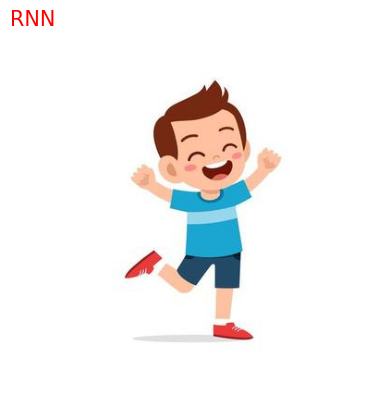

In [39]:
Predict_depression("I am not a depressed person that who see the world from his dark window", models)

# Done e' 🧠🧠🧠 by:

- `Mo```Shaeerah` 🏹⁀➴ https://github.com/Mo-Shaeerah